# U-Net on Graphene Images
This is a modification to a U-Net on the Oxford-IIIT Pet Dataset. Original code is located at https://colab.research.google.com/github/zaidalyafeai/Notebooks/blob/master/unet.ipynb

Mount Google Drive and define path to dataset. There are two paths: one to the dataset (dataset_dir) and another to the folder which you put `utils.py' in (project_dir).

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [30]:
import os
import sys

# directory of the project, folder which you put utils.py in
project_dir = os.path.abspath("/content/gdrive/Shared drives/Graphene_DL_2")
# path to the dataset, should contain 3 subfolders: train2019, val2019 and annotations
dataset_dir = os.path.abspath("/content/gdrive/Shared drives/Graphene_DL_2")

# model paths to save or load the models
model_path = "/content/gdrive/Shared drives/Graphene_DL_2/Unet_h5_files/Five_layer_good_model.h5"
model_path1 = "/content/gdrive/Shared drives/Graphene_DL_2/Unet_h5_files/Good_model7.h5"

few_layer_path = "/content/gdrive/Shared drives/Graphene_DL_2/Unet_h5_files/Few_layer_test.h5"
RGB_model_path = "/content/gdrive/Shared drives/Graphene_DL_2/Unet_h5_files/RGB_bilayer_with_attached_lr_00008_ep600_PW06_modfied_loss_th_084_1.h5"

SVM_model_path = "/content/gdrive/Shared drives/Graphene_DL_2/Unet_h5_files/SVM_gaussian.sav"
SVM_model_path_l= "/content/gdrive/Shared drives/Graphene_DL_2/Unet_h5_files/SVM_linear.sav"
SVM_model_path_p= "/content/gdrive/Shared drives/Graphene_DL_2/Unet_h5_files/SVM_poly_3.sav"
sys.path.append(project_dir)  # To find local version of the library: utils
import utils

Import the libraries for use

In [3]:

from tensorflow.keras.utils import get_custom_objects
from tensorflow.keras.models import load_model


import numpy as np
import matplotlib.pyplot as plt
import tensorflow.keras as keras
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Input, Conv2DTranspose, Concatenate
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import backend as K
import tensorflow as tf
import cv2
from imgaug import augmenters as iaa

# from random import shuffle

# Define hyper-parameters

In [4]:
epochs = 0 # no. of training epochs
batch_size = 32 
default_learning_rate = 0.001

# define U-Net input image size
default_input_size = (256,256,3)

# define weight of positive errors
pos_weight = 200
 
# start training your model. Set to 0 if you want to train from scratch
initial_epoch =0
threshold = 0.5

Define augmenter: 

In [5]:
# define augmenter
# first crop images at a random position
# then randomly apply 0 to 4 of the methods: horizontally flip, vertically flip, rotate and shift
seq_train = iaa.Sequential([
            iaa.SomeOf((0, 4),[
                iaa.Fliplr(), # horizontally flip
                iaa.Flipud(), # vertically flip
                iaa.Affine(rotate=(0,359)), # rotate
                iaa.Affine(translate_percent={"x": (-0.1, 0.1),"y": (-0.1, 0.1)}), # shift
                # More as you want ...
    ])
])


# Generator function
Functions contains "yield" keyword are called generator functions. Unlike "return", "yield" doesn't destroy the state of function. Intuitively, generator functions are similar to a for loop that can only be iterated over once. To learn more, read this: https://pythontips.com/2013/09/29/the-python-yield-keyword-explained/

In [6]:
def image_generator(dataset,seq=None, batch_size = 32, image_size = (1024,1024)):
  
  while True: 
    
    #extract a random batch 
    batch = np.random.choice(dataset.image_ids, size = batch_size)    
    
    #variables for collecting batches of inputs and outputs 
    batch_x = []
    batch_y = []
    
    if seq: # apply augmentation
      # make stochastic augmenter deterministic (similar to drawing random samples from a distribution)
        seq_det = seq.to_deterministic()

    for f in batch:

        #preprocess the raw images 
        raw = dataset.load_image(f)

        raw = np.clip(cv2.resize(raw, dsize=image_size,interpolation=cv2.INTER_CUBIC),0, 255)

        #get the mask
        #mask = np.clip(np.sum(dataset.load_mask(f)[0],axis=-1,keepdims=True),a_min=0,a_max=1)
        ##gt_mask = dataset.load_mask(f)
        mask = np.clip(np.sum(dataset.load_mask(f)[0],axis=-1,keepdims=True),a_min=0,a_max=1)
        ##mask = np.clip(np.sum(gt_mask[0][:,:,[i for i in range(len(gt_mask[1])) if gt_mask[1][i] ==1]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
        mask = cv2.resize(mask.astype(np.float32), dsize=image_size, interpolation=cv2.INTER_CUBIC)

        # pre-process the mask 
        mask[mask != 0 ] = 1
        batch_x.append(raw)
        batch_y.append(mask)

    # pre-process a batch of images and masks 
    batch_x = np.array(batch_x)/255. # normalize raw images
    batch_y = np.expand_dims(np.array(batch_y),3)# add color channel to the black-and-white masks

    if seq:
        # augment images and masks
        batch_x = np.array(seq_det.augment_images(batch_x))
        batch_y = np.array(seq_det.augment_images(batch_y))

    yield (batch_x, batch_y)

In [7]:
# build a CocoDataset object for training images
dataset_train = utils.CocoDataset()
dataset_train.load_coco(dataset_dir, "train")
dataset_train.prepare()

# build a CocoDataset object for validation images
dataset_val = utils.CocoDataset()
dataset_val.load_coco(dataset_dir, "val")
dataset_val.prepare()

# build generators for training and testing
train_generator = image_generator(dataset_train,seq=seq_train, batch_size = batch_size,image_size=default_input_size[:2])

test_generator  = image_generator(dataset_val,seq=None, batch_size = 57,image_size=default_input_size[:2])

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


Test the generators by plotting the images

Text(0.5, 1.0, 'Ground Truth')

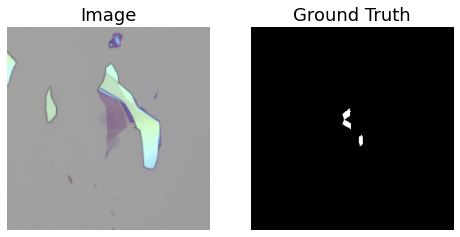

In [8]:
x, y= next(test_generator) # x is the raw images, y is the ground truth masks

img = x[0]
msk = y[0].squeeze()
msk = np.stack((msk,)*3, axis = -1)

fig, ax = plt.subplots(1,2,figsize = (8,16))
[axi.set_axis_off() for axi in ax]
ax[0].imshow(img)
ax[0].set_title('Image',fontsize=18)
ax[1].imshow(msk)
ax[1].set_title('Ground Truth',fontsize=18)

# IoU metric

The intersection over union (IoU) metric is a simple metric used to evaluate the performance of a segmentation algorithm. Given two masks $y_{true}, y_{pred}$ we evaluate 

$$IoU = \frac{y_{true} \cap y_{pred}}{y_{true} \cup y_{pred}}$$

In [9]:
def mean_iou(y_true, y_pred):
    yt0 = y_true[:,:,:,0]
    yp0 = K.cast(y_pred[:,:,:,0] > 0.5, 'float32')
    inter = tf.math.count_nonzero(tf.math.logical_and(tf.equal(yt0, 1), tf.equal(yp0, 1)))
    union = tf.math.count_nonzero(tf.add(yt0, yp0))
    iou = tf.where(tf.equal(union, 0), 1., tf.cast(inter/union, 'float32'))
    return iou

# Weighted binary crossentropy loss 
Assume we have $N$ samples in total, $y_{true}$ is a ground truth segmentation mask, $y_{pred}$ is the CNN-predicted segmentation mask, the binary crossentropy is defined as:
$$L_{binary\_ce} = -\frac{1}{N}\sum_{1}^{N}y_{true} * log(y_{pred})+(1-y_{true})*log(1-y_{pred})$$
And weighted binary crossentropy is defined as:
$$L_{w\_binary\_ce} = -\frac{1}{N}\sum_{1}^{N} w * y_{true} * log(y_{pred})+(1-y_{true})*log(1-y_{pred})$$
Here, $w$ represents the weight for positive errors. Weighted loss here is used to handle class imbalance in the dataset.

In [10]:
def create_weighted_binary_crossentropy(pos_weight):

    def weighted_binary_crossentropy(y_true, y_pred):

        # Original binary crossentropy (see losses.py):
        # K.mean(K.binary_crossentropy(y_true, y_pred), axis=-1)

        # Calculate the binary crossentropy
        b_ce = K.binary_crossentropy(y_true, y_pred)

        # Apply the weights
        weight_vector = y_true * pos_weight + (1. - y_true)
        weighted_b_ce = weight_vector * b_ce

        # Return the mean error
        return K.mean(weighted_b_ce)

    return weighted_binary_crossentropy

# Define the UNet model function

In [11]:
def unet_attached(sz = default_input_size):
  x = Input(sz) 
  inputs = x
  
  #down sampling 
  Num_of_filters = 8 
  layers = [] 
  
  for i in range(6):
    x = Conv2D(Num_of_filters, 3, activation='relu', padding='same') (x)
    x = Conv2D(Num_of_filters, 3, activation='relu', padding='same') (x)
    layers.append(x)
    x = MaxPooling2D() (x)
    Num_of_filters = Num_of_filters * 2

    
  ff2 = 64 
  
  #bottleneck 
  j = len(layers) - 1 
  x = Conv2D(Num_of_filters, 3, activation='relu', padding='same') (x)
  x = Conv2D(Num_of_filters, 3, activation='relu', padding='same') (x)
  x = Conv2DTranspose(ff2, 2, strides=(2, 2), padding='same') (x)
  x = Concatenate(axis=3)([x, layers[j]])
  j = j -1 
  
  #upsampling 
  for i in range(5):
    ff2 = ff2//2
    Num_of_filters = Num_of_filters // 2 
    x = Conv2D(Num_of_filters, 3, activation='relu', padding='same') (x)
    x = Conv2D(Num_of_filters, 3, activation='relu', padding='same') (x)
    x = Conv2DTranspose(ff2, 2, strides=(2, 2), padding='same') (x)
    x = Concatenate(axis=3)([x, layers[j]])
    j = j -1 
    
  
  #classification 
  x = Conv2D(Num_of_filters, 3, activation='relu', padding='same') (x)
  x = Conv2D(Num_of_filters, 3, activation='relu', padding='same') (x)
  

  ########################################################
  ###### Attached layers to the original UNet model ######
  ########################################################
  x = Conv2D(256, 5,activation='linear', padding='same')(x)
  x=tf.keras.layers.LeakyReLU(alpha=0.1)(x)
  x = Conv2D(128, 5,activation='linear', padding='same')(x)
  x=tf.keras.layers.LeakyReLU(alpha=0.1)(x)
  x = Conv2D(64, 5,activation='linear', padding='same')(x)
  x=tf.keras.layers.LeakyReLU(alpha=0.1)(x)
  x = Conv2D(32, 5,activation='linear', padding='same')(x)
  x=tf.keras.layers.LeakyReLU(alpha=0.1)(x)
  x = Conv2D(16, 5,activation='linear', padding='same')(x)
  x=tf.keras.layers.LeakyReLU(alpha=0.1)(x)
  ########################################################
  ########################################################
  
  outputs = Conv2D(1, 1, activation='sigmoid') (x)
  
  #model creation 
  model = Model(inputs=[inputs], outputs=[outputs])

  # Optimizer for the model
  opt = keras.optimizers.Adam(learning_rate = default_learning_rate) # use Adam as optimizer

  # Compile the model
  model.compile(optimizer = opt, loss = create_weighted_binary_crossentropy(pos_weight), metrics = [mean_iou])
  
  return model


# Define custom callbacks

In [12]:
def build_callbacks():
  checkpointer = ModelCheckpoint(filepath=model_path, verbose=0, save_best_only=True, save_weights_only=False)
  callbacks = [checkpointer, PlotLearning()]
  return callbacks

# inheritance for training process plot 
class PlotLearning(keras.callbacks.Callback):

    def on_train_begin(self, logs={}):
        self.i = 0
        self.x = []
        self.losses = []
        self.val_losses = []
        self.acc = []
        self.val_acc = []
        self.logs = []
    def on_epoch_end(self, epoch, logs={}):
        self.logs.append(logs)
        self.x.append(epoch)
        self.losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))
        self.acc.append(logs.get('mean_iou'))
        self.val_acc.append(logs.get('val_mean_iou'))
       
        print('epoch =',epoch,'loss=',logs.get('loss'),'val_loss=',logs.get('val_loss'),'mean_iou=',logs.get('mean_iou'),'val_mean_iou=',logs.get('val_mean_iou'))
        
        #choose a test image and preprocess
        raw = cv2.resize(dataset_val.load_image(0),
                         dsize=default_input_size[:2],
                         interpolation=cv2.INTER_CUBIC)/255.
        # get ground truth mask
        mask = np.clip(np.sum(dataset_val.load_mask(0)[0],axis=-1,keepdims=True),a_min=0,a_max=1)
        mask = cv2.resize(mask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)

        # pre-process the mask 
        mask[mask != 0 ] = 1
        # mask = np.tile(mask[:,:,np.newaxis], (1,1,3))

        #predict the mask 
        pred = model.predict(np.expand_dims(raw, 0))
        
        # predicted mask post-processing 
        pred  = pred.squeeze()

        pred_mask = np.array(pred)
        pred_mask = exponen(pred_mask)

        fig, ax = plt.subplots(1,4,figsize=(10,40))
        [axi.set_axis_off() for axi in ax.ravel()]
        ax[0].imshow(raw)
        ax[0].set_title('Image',fontsize=14)
        ax[1].imshow(mask,cmap='gray')
        ax[1].set_title('Ground Truth',fontsize=14)
        ax[2].imshow(pred,cmap='gray')
        ax[2].set_title('Prediction',fontsize=14)
        ax[3].imshow(pred_mask,cmap='gray')
        ax[3].set_title('Post-processed prediction',fontsize=14)

        plt.show()

# Build the model and train

In [13]:
train_steps = dataset_train.num_images //batch_size
test_steps = dataset_val.num_images //batch_size

# code checking if ckpt exists
if os.path.isfile(model_path):
    get_custom_objects().update({"weighted_binary_crossentropy":create_weighted_binary_crossentropy(pos_weight),
                                 "mean_iou":mean_iou})
    model_attached = load_model(model_path)
else:
    initial_epoch = 0
    model_attached = unet_attached()

# print model summary 
model_attached.summary()

# history object
history = model_attached.fit(train_generator, 
          epochs = epochs,
          initial_epoch = initial_epoch,
          steps_per_epoch = train_steps,
          validation_data = test_generator,
          validation_steps = test_steps,
          callbacks = build_callbacks(),
          verbose = 0)


Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_64 (Conv2D)              (None, 256, 256, 8)  224         input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_65 (Conv2D)              (None, 256, 256, 8)  584         conv2d_64[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_12 (MaxPooling2D) (None, 128, 128, 8)  0           conv2d_65[0][0]                  
_______________________________________________________________________________________

# Plot training and validation loss vs epoch 

In [14]:
# set font size for all elements in plot
plt.rcParams.update({'font.size': 14})

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

f = open("loss.txt","w") #opens file with name of "test.txt"
f1 = open("val_loss.txt","w")
f.write(str(history.history['loss']).strip('[]'))
f1.write(str(history.history['val_loss']).strip('[]'))
f.close()
f1.close()

KeyError: ignored

#Plot raw images + ground truth masks + detection masks for attached UNet model

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


0.04322004318237305
0.04517239609212599


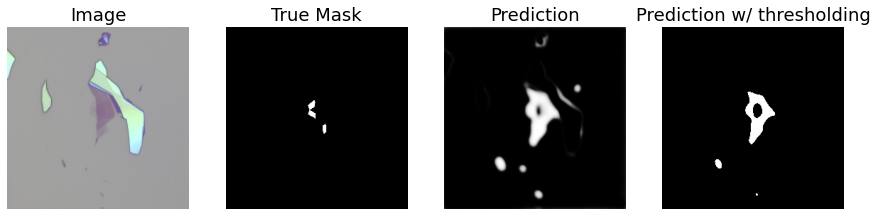

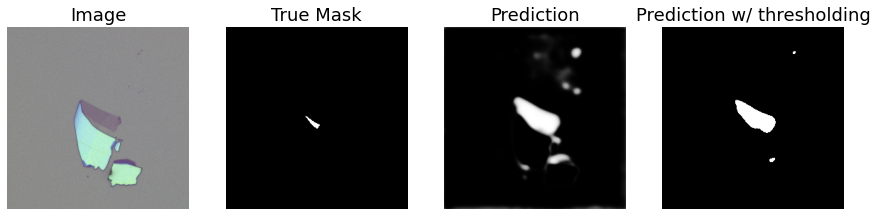

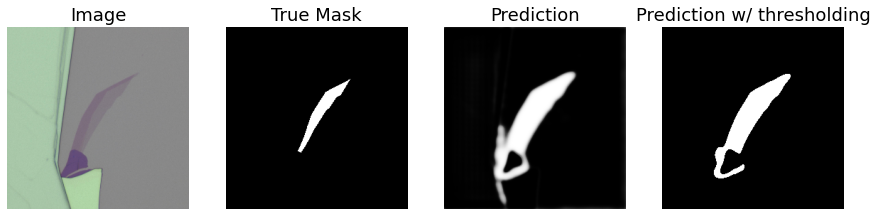

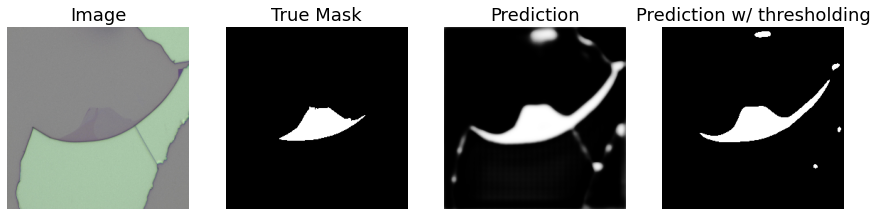

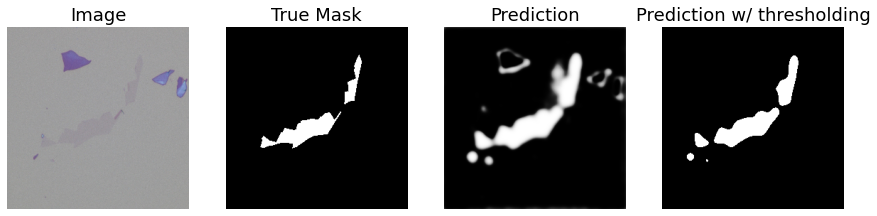

...

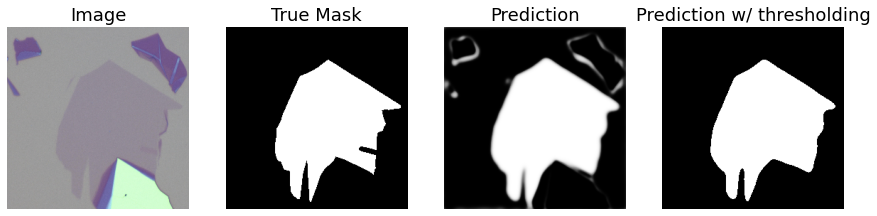

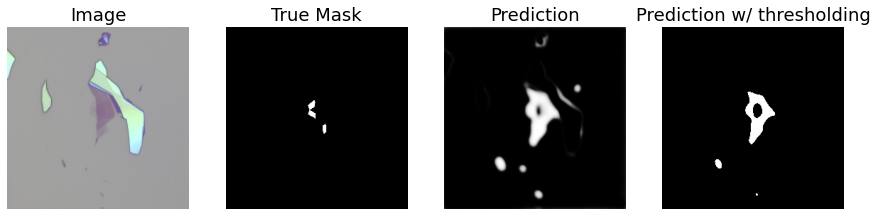

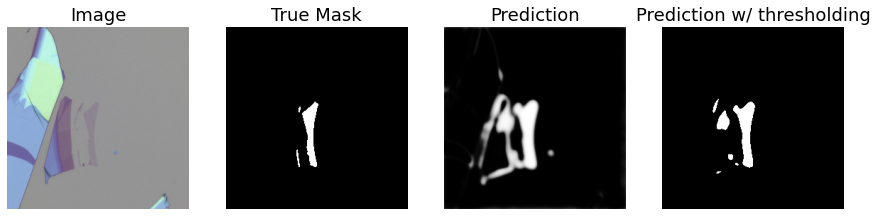

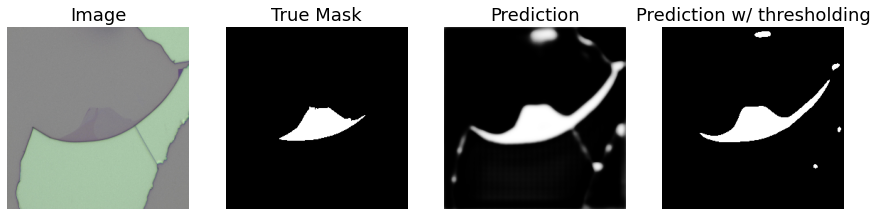

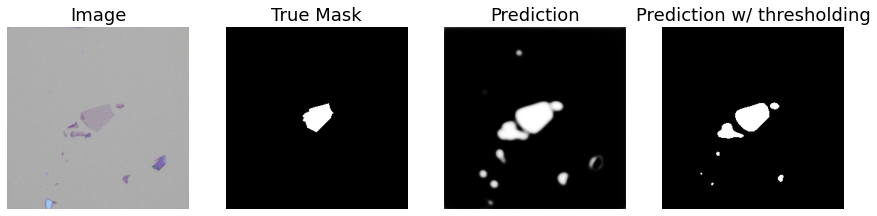

In [15]:
for i in range(32):  
  img = x[i]
  msk = y[i].squeeze()
  pred = model_attached.predict(np.expand_dims(img, 0)).squeeze()
  pred_mask = (pred >= 0.88).astype(np.float32) # pred >= threshold
  fig, ax = plt.subplots(1, 4, figsize=(15,60))
  [axi.set_axis_off() for axi in ax.ravel()]
  ax[0].imshow(img)
  ax[0].set_title('Image', fontsize=18)
  ax[1].imshow(msk, cmap = 'gray')
  ax[1].set_title('True Mask',fontsize=18)
  ax[2].imshow(pred, cmap = 'gray')
  ax[2].set_title('Prediction',fontsize=18)
  ax[3].imshow(pred_mask, cmap = 'gray')
  ax[3].set_title('Prediction w/ thresholding',fontsize=18)

total_msk_graphene = np.sum(y)
grd_graphene_to_whole_image = total_msk_graphene/(256*256*32)
grd_graphene_to_bg = total_msk_graphene/(256*256*32 - total_msk_graphene)
print(grd_graphene_to_whole_image)
print(grd_graphene_to_bg)

# Evaluation Metrics Definition

In [16]:
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision
    
def false_alarm_m(y_true, y_pred):
    false_positives = K.sum(K.round(K.clip((1 - y_true) * y_pred, 0, 1)))
    true_negatives = K.sum(K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)))
    false_alarm = false_positives / (false_positives + true_negatives)
    return false_alarm 

recall_m(msk,pred_mask)

<tf.Tensor: shape=(), dtype=float32, numpy=0.99715906>

In [17]:
def compute_recall_precision(dataset, threshold, model_name, model_name2 = None, sz = default_input_size[:2]):    
    recall = 0
    precision = 0
    false_alarm = 0
       
    for im_id in dataset.image_ids:

        #get the mask
        mask = np.clip(np.sum(dataset.load_mask(im_id)[0], axis = -1, keepdims = True), a_min = 0, a_max = 1)
        mask = cv2.resize(mask.astype(np.float32), dsize = sz, interpolation = cv2.INTER_CUBIC)

        #preprocess the raw images 
        raw = cv2.resize(dataset.load_image(im_id), dsize = sz, interpolation = cv2.INTER_CUBIC)
        pred = model_name.predict(np.expand_dims(raw/255., 0)).squeeze() # raw image (256,256,3), after expansion: (1, 256, 256, 3)

        if model_name2 != None: 
          pred = pred[:,:,None]*(raw/255.)
          pred = model_name2.predict(np.expand_dims(pred, 0)).squeeze() #pred(=raw image * pred mask ) (256,256,3), after expansion: (1, 256, 256, 3)

        # Threshold it to 0 or 1
        pred_mask = (pred >= threshold).astype(np.float32)
        recall += recall_m(mask,pred_mask)
        precision += precision_m(mask,pred_mask)
        false_alarm += false_alarm_m(mask,pred_mask)

    recall /= len(dataset.image_ids)
    precision /= len(dataset.image_ids)
    false_alarm /= len(dataset.image_ids)
    return (recall, precision, false_alarm)

In [18]:
rec_val_attached_value, prec_val_attached_values, false_ala_val_attached_value = compute_recall_precision(dataset_val, 0.88, model_attached)
print(rec_val_attached_value, prec_val_attached_values, false_ala_val_attached_value )

tf.Tensor(0.9505101, shape=(), dtype=float32) tf.Tensor(0.523563, shape=(), dtype=float32) tf.Tensor(0.026580246, shape=(), dtype=float32)


In [ ]:
for j in range(57):
  raw = cv2.resize(dataset_val.load_image(j),
                         dsize=default_input_size[:2],
                         interpolation=cv2.INTER_CUBIC)/255
  mask = np.clip(np.sum(dataset_val.load_mask(j)[0],axis=-1,keepdims=True),a_min=0,a_max=1)
  mask = cv2.resize(mask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  mask[mask != 0 ] = 1

  # Ground truth monolayer
  mmask = np.clip(np.sum(dataset_val.load_mask(j)[0][:,:,[i for i in range(len(dataset_val.load_mask(j)[1])) if dataset_val.load_mask(j)[1][i]==2]],axis=-1,keepdims=True),a_min=0,a_max=1)
  mmask = cv2.resize(mmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  mmask[mmask != 0 ] = 1
 
  
  # Ground truth bilayer
  bmask = np.clip(np.sum(dataset_val.load_mask(j)[0][:,:,[i for i in range(len(dataset_val.load_mask(j)[1])) if dataset_val.load_mask(j)[1][i]==1]],axis=-1,keepdims=True),a_min=0,a_max=1)
  bmask = cv2.resize(bmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  bmask[bmask != 0 ] = 1
 

  print(j)
  fig, ax = plt.subplots(1,4,figsize=(15,60))
  [axi.set_axis_off() for axi in ax.ravel()]
  ax[0].imshow(raw)
  ax[0].set_title('Image',fontsize=18)
  ax[1].imshow(mask,cmap='gray')
  ax[1].set_title('Total Mask',fontsize=18)
  ax[2].imshow(mmask,cmap='gray')
  ax[2].set_title('Mono',fontsize=18)
  ax[3].imshow(bmask,cmap='gray')
  ax[3].set_title('Bilayer',fontsize=18)
  plt.show()


#SVM training data set

In [ ]:
## Step 1. Create empty lists to store pixel values
R0 = [] # create 3 lists to store background pixel values
G0 = []
B0 = []
R1 = [] # create 3 lists to store monolayer pixel values
G1 = []
B1 = []
R2 = [] # create 3 lists to store bilayer pixel values
G2 = []
B2 = []


## Step 2. Load total ground truth RGB pixel intensities multiplied by UNet masks
for i in range(246): 
    
    raw = cv2.resize(dataset_train.load_image(i), # Original raw images
                         dsize=default_input_size[:2],
                         interpolation=cv2.INTER_CUBIC)/255
    pred_mask = model_attached.predict(np.expand_dims(raw, 0)).squeeze() # predict masks from UNet
    graphene_pred = pred_mask[:,:,None] * raw
    graphene_pred = graphene_pred*(1 + np.sign(pred_mask[:,:,None]- 0.844))/2

#Ground truth monolayer
    mmask = np.clip(np.sum(dataset_train.load_mask(i)[0][:,:,[a for a in range(len(dataset_train.load_mask(i)[1])) if dataset_train.load_mask(i)[1][a] == 2]],axis=-1,keepdims=True),a_min=0,a_max=1)
    mmask = cv2.resize(mmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
    mmask[mmask != 0 ] = 1
    raw = cv2.resize(dataset_train.load_image(i),
            dsize=default_input_size[:2],
            interpolation=cv2.INTER_CUBIC)/255
    img = raw 
    graphene1 = mmask[:,:,None] * graphene_pred # Unet predicted monolayer mask

# Ground truth bilayer
    bmask = np.clip(np.sum(dataset_train.load_mask(i)[0][:,:,[b for b in range(len(dataset_train.load_mask(i)[1])) if dataset_train.load_mask(i)[1][b] == 1]],axis=-1,keepdims=True),a_min=0,a_max=1)
    bmask = cv2.resize(bmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
    bmask[bmask != 0 ] = 1
    graphene2 = bmask[:,:,None] * graphene_pred # Unet predicted bilayer mask

# Combine the monolayer and bilayer ground truths                    
    graphene = np.append(graphene1, graphene2, axis = 0)
    r, g, b = cv2.split(graphene)
    fig = plt.figure()
    axis = fig.add_subplot(1, 1, 1, projection="3d")
    pixel_colors = graphene.reshape((np.shape(graphene)[0]*np.shape(graphene)[1], 3))

## Step 3. Plot the RGB distribution of total ground truth pixel intensities multiplied by UNet masks
    pix_c=[] 
    R=[]
    G=[]
    B=[]
    r=r.flatten()
    g=g.flatten()
    b=b.flatten()
    for j in range(len(r)):
      if r[j]+g[j]+b[j] != 0:
        R.append(r[j])
        G.append(g[j])
        B.append(b[j])
        pix_c.append(pixel_colors[j])
    R=np.array(R)
    G=np.array(G)
    B=np.array(B)
    axis.scatter(R, G, B, facecolors =pix_c, marker=".")
    axis.set_xlabel("Red")
    axis.set_ylabel("Green")
    axis.set_zlabel("Blue")
    plt.show()

## Step 4. Prepare and store the background, monolayer and bilayer RGB pixel values separately  
    # Monolayer
    r1, g1, b1 = cv2.split(graphene1) # monolayer RGB pixel intensities
    r1=r1.flatten()
    g1=g1.flatten()
    b1=b1.flatten()  
    for j in range(len(r1)):
      if r1[j]+g1[j]+b1[j] != 0:
        R1.append(r1[j])
        G1.append(g1[j])
        B1.append(b1[j])        
        pix_c.append(pixel_colors[j])
    
    # Bilayer
    r2, g2, b2 = cv2.split(graphene2) # graphene1 is monolayer   
    r2=r2.flatten()
    g2=g2.flatten()
    b2=b2.flatten()  
    for j in range(len(r1)):
      if r2[j]+g2[j]+b2[j] != 0:
        R2.append(r2[j])
        G2.append(g2[j])
        B2.append(b2[j])
        pix_c.append(pixel_colors[j])

    # for background
    mask = np.clip(np.sum(dataset_train.load_mask(i)[0],axis=-1,keepdims=True),a_min=0,a_max=1)
    mask = cv2.resize(mask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
    # pre-process the mask 
    mask[mask != 0 ] = 1
    background = (1 - mask)[:,:,None] * graphene_pred
    r0, g0, b0 = cv2.split(background) # graphene1 is monolayer   
    r0=r0.flatten()
    g0=g0.flatten()
    b0=b0.flatten()  
    for j in range(len(r0)):
      if r0[j]+g0[j]+b0[j] != 0:
        R0.append(r0[j])
        G0.append(g0[j])
        B0.append(b0[j])
        pix_c.append(pixel_colors[j])

## Step 5. Convert the RGB list to array 
R1=np.array(R1)
G1=np.array(G1)
B1=np.array(B1)
result1 = np.ones(len(R1)) # monolayer

R2=np.array(R2)
G2=np.array(G2)
B2=np.array(B2)
result2 = 2*np.ones(len(R2)) # bilayer

R0=np.array(R0)
G0=np.array(G0)
B0=np.array(B0)
result0 = np.zeros(len(R0)) # background

## Step 6. Combine the RGB values of monolayer, bilayer and background for SVM input dataset
graphene_R_train = np.append(R0, R1)
graphene_R_train = np.append(graphene_R_train, R2)
graphene_G_train = np.append(G0, G1)
graphene_G_train = np.append(graphene_G_train,G2)
graphene_B_train = np.append(B0, B1)
graphene_B_train = np.append(graphene_B_train,B2)
result_train = np.append(result0, result1)
result_train = np.append(result_train, result2)

#SVM testing data set

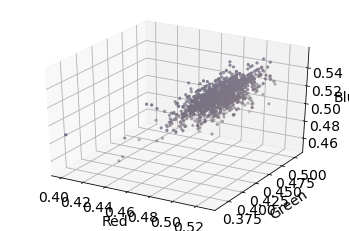

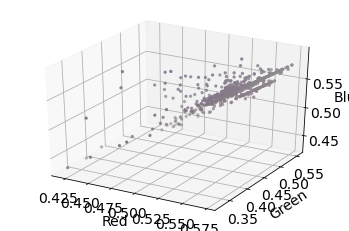

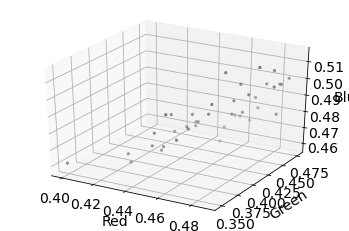

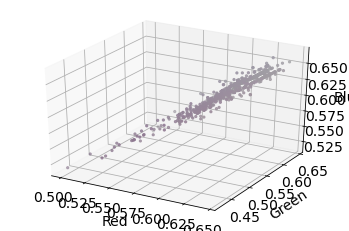

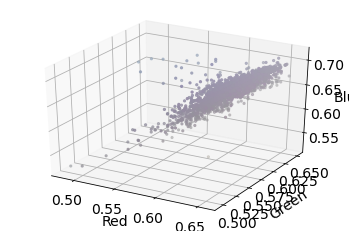

...

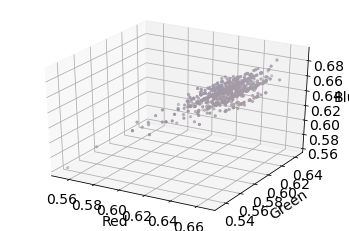

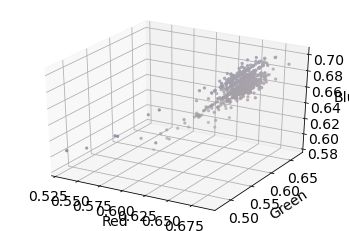

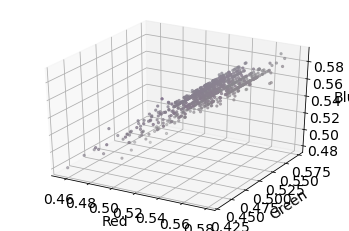

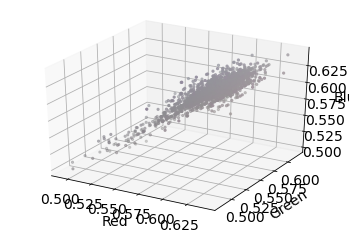

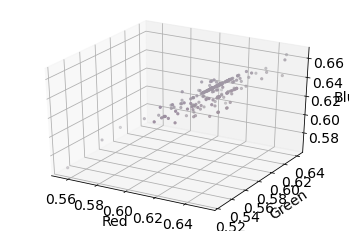

In [23]:
## similart process to SVM training dataset but here is for testing dataset
R0 = []
G0 = []
B0 = []
R1 = []
G1 = []
B1 = []
R2 = []
G2 = []
B2 = []
# print the ground truth monolayer distribution
for i in range(57): 
    
    raw = cv2.resize(dataset_val.load_image(i),
                         dsize=default_input_size[:2],
                         interpolation=cv2.INTER_CUBIC)/255
    pred_mask = model_attached.predict(np.expand_dims(raw, 0)).squeeze()
    graphene_pred = pred_mask[:,:,None] * raw
    graphene_pred = graphene_pred*(1 + np.sign(pred_mask[:,:,None]- 0.844))/2
#Ground truth monolayer
    mmask = np.clip(np.sum(dataset_val.load_mask(i)[0][:,:,[a for a in range(len(dataset_val.load_mask(i)[1])) if dataset_val.load_mask(i)[1][a] == 2]],axis=-1,keepdims=True),a_min=0,a_max=1)
    mmask = cv2.resize(mmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
    mmask[mmask != 0 ] = 1
    raw = cv2.resize(dataset_val.load_image(i),
            dsize=default_input_size[:2],
            interpolation=cv2.INTER_CUBIC)/255
    img = raw #x[i]
    graphene1 = mmask[:,:,None] * graphene_pred

# Ground truth bilayer

    bmask = np.clip(np.sum(dataset_val.load_mask(i)[0][:,:,[b for b in range(len(dataset_val.load_mask(i)[1])) if dataset_val.load_mask(i)[1][b] == 1]],axis=-1,keepdims=True),a_min=0,a_max=1)
    bmask = cv2.resize(bmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
    bmask[bmask != 0 ] = 1
    graphene2 = bmask[:,:,None] * graphene_pred
                        
    graphene = np.append(graphene1, graphene2,axis = 0)
    r, g, b = cv2.split(graphene)
    fig = plt.figure()
    axis = fig.add_subplot(1, 1, 1, projection="3d")

    pixel_colors = graphene.reshape((np.shape(graphene)[0]*np.shape(graphene)[1], 3))

    pix_c=[]
    R=[]
    G=[]
    B=[]
    r=r.flatten()
    g=g.flatten()
    b=b.flatten()
    for j in range(len(r)):
      if r[j]+g[j]+b[j] != 0:
        R.append(r[j])
        G.append(g[j])
        B.append(b[j])
        pix_c.append(pixel_colors[j])
    R=np.array(R)
    G=np.array(G)
    B=np.array(B)
    axis.scatter(R, G, B, facecolors =pix_c, marker=".")
    axis.set_xlabel("Red")
    axis.set_ylabel("Green")
    axis.set_zlabel("Blue")
    plt.show()

    # for monolayer
    r1, g1, b1 = cv2.split(graphene1) # graphene1 is monolayer
    r1=r1.flatten()
    g1=g1.flatten()
    b1=b1.flatten()  
    for j in range(len(r1)):
      if r1[j]+g1[j]+b1[j] != 0:
        R1.append(r1[j])
        G1.append(g1[j])
        B1.append(b1[j])        
        pix_c.append(pixel_colors[j])
    
 
    # for bilayer
    r2, g2, b2 = cv2.split(graphene2) # graphene1 is monolayer   
    r2=r2.flatten()
    g2=g2.flatten()
    b2=b2.flatten()  
    for j in range(len(r1)):
      if r2[j]+g2[j]+b2[j] != 0:
        R2.append(r2[j])
        G2.append(g2[j])
        B2.append(b2[j])
        pix_c.append(pixel_colors[j])

    # for background
    mask = np.clip(np.sum(dataset_val.load_mask(i)[0],axis=-1,keepdims=True),a_min=0,a_max=1)
    mask = cv2.resize(mask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
    # pre-process the mask 
    mask[mask != 0 ] = 1
    background = (1 - mask)[:,:,None] * graphene_pred
    r0, g0, b0 = cv2.split(background) # graphene1 is monolayer   
    r0=r0.flatten()
    g0=g0.flatten()
    b0=b0.flatten()  
    for j in range(len(r0)):
      if r0[j]+g0[j]+b0[j] != 0:
        R0.append(r0[j])
        G0.append(g0[j])
        B0.append(b0[j])
        pix_c.append(pixel_colors[j])

R1=np.array(R1)
G1=np.array(G1)
B1=np.array(B1)
result1 = np.ones(len(R1))

R2=np.array(R2)
G2=np.array(G2)
B2=np.array(B2)
result2 = 2*np.ones(len(R2))

R0=np.array(R0)
G0=np.array(G0)
B0=np.array(B0)
result0 = np.zeros(len(R0))

graphene_R_val = np.append(R0, R1)
graphene_R_val = np.append(graphene_R_val, R2)
graphene_G_val = np.append(G0, G1)
graphene_G_val = np.append(graphene_G_val,G2)
graphene_B_val = np.append(B0, B1)
graphene_B_val = np.append(graphene_B_val,B2)
result_val = np.append(result0, result1)
result_val = np.append(result_val, result2)

In [24]:
# Preparing for the training dataset
from sklearn.svm import SVC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm, datasets
from mpl_toolkits.mplot3d import Axes3D
from sklearn.model_selection import train_test_split

X_Train = np.stack((graphene_R_train, graphene_G_train, graphene_B_train), axis = 0)
X_Train = X_Train.transpose()

X_Test = np.stack((graphene_R_val, graphene_G_val, graphene_B_val), axis = 0)
X_Test = X_Test.transpose()

Y_Train = result_train
Y_Test = result_val

In [25]:
# Dataset Normalization
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
X_Train = sc_X.fit_transform(X_Train)
X_Test = sc_X.transform(X_Test)

# SVM training model


In [27]:
# use pickle to save the data for SVM
import pickle 

In [26]:
## SVM training model
# from sklearn.preprocessing import StandardScaler
# sc_X = StandardScaler()
# X_Train = sc_X.fit_transform(X_Train)
# X_Test = sc_X.transform(X_Test)

# model_svm = svm.SVC(kernel='rbf',verbose=True)
# clf = model_svm.fit(X_Train, Y_Train)

## Save the model after training a model
#pickle.dump(clf, open(SVM_model_path , 'wb')) 

In [32]:
## Load a trained model
clf1 = pickle.load(open(SVM_model_path, 'rb'))  # 'rb' for reading binary file

## Print the confusion metrics
y_pred = clf1.predict(X_Test)
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(Y_Test, y_pred))
print(classification_report(Y_Test, y_pred))

[[82733  7816 16146]
 [ 4476 18265  4452]
 [ 4976  6496 63390]]
              precision    recall  f1-score   support

         0.0       0.90      0.78      0.83    106695
         1.0       0.56      0.67      0.61     27193
         2.0       0.75      0.85      0.80     74862

    accuracy                           0.79    208750
   macro avg       0.74      0.76      0.75    208750
weighted avg       0.80      0.79      0.79    208750



# Plot the SVM results

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


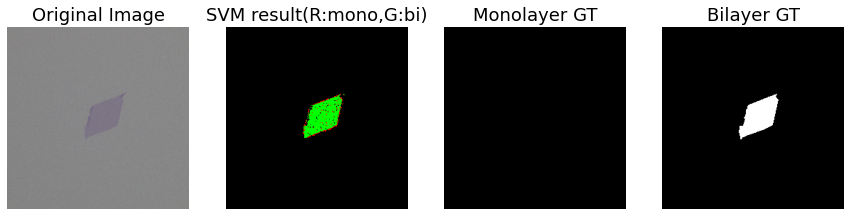

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


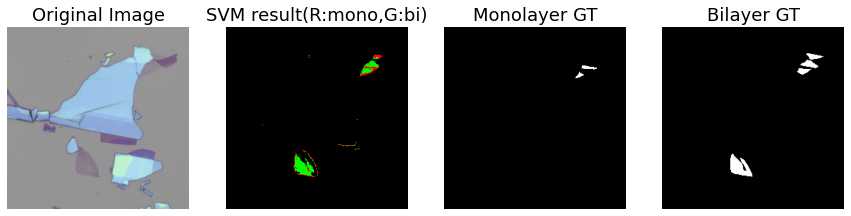

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


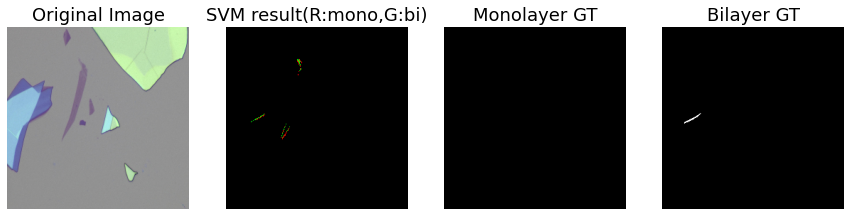

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


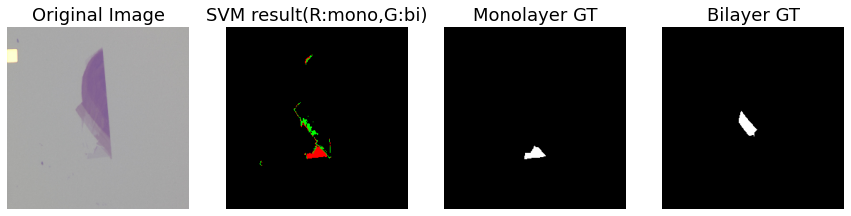

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


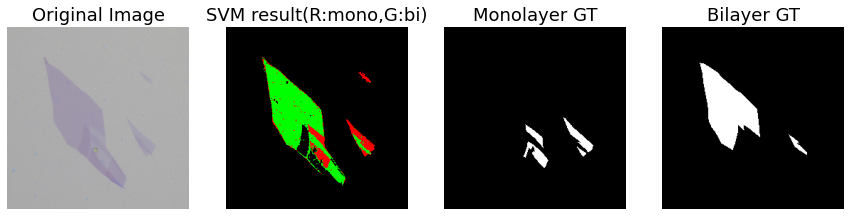

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


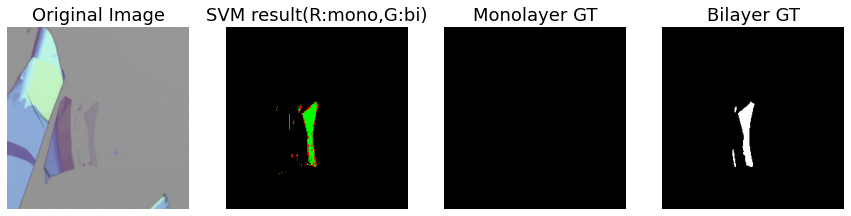

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


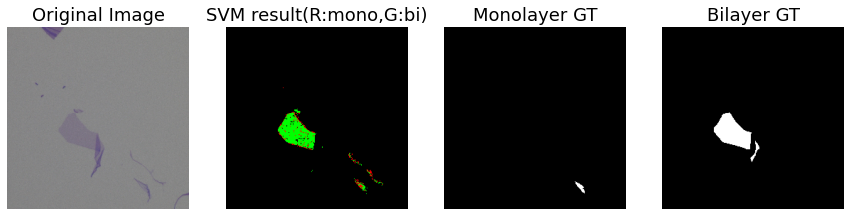

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


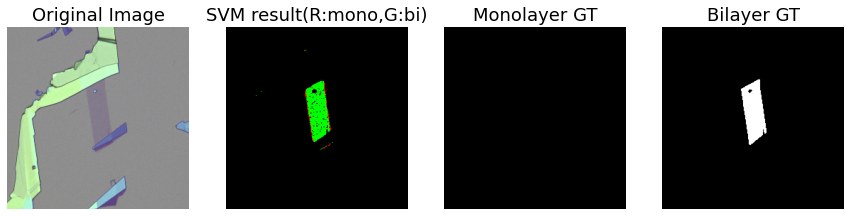

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


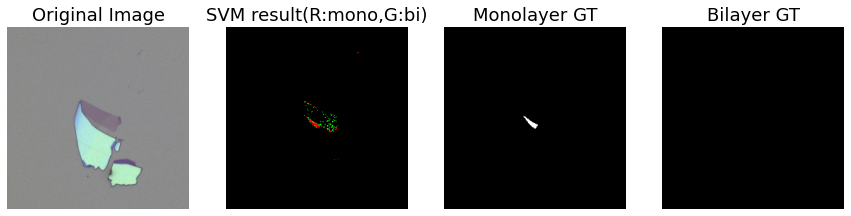

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


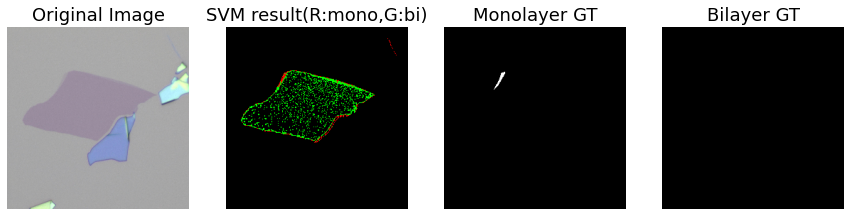

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


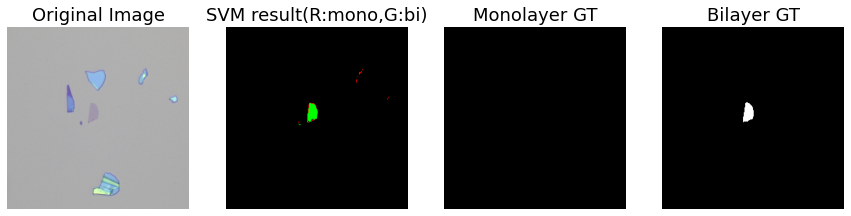

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


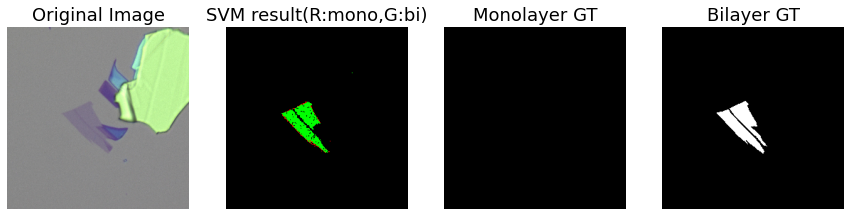

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


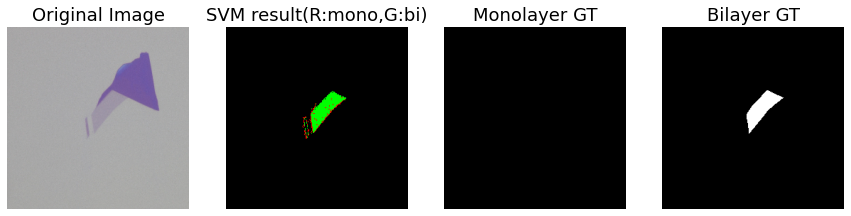

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


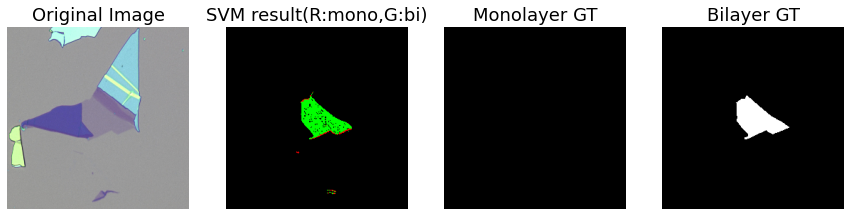

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


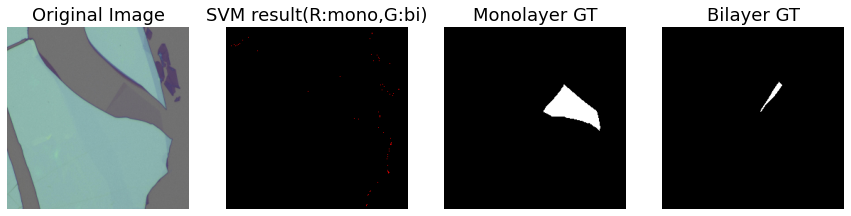

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


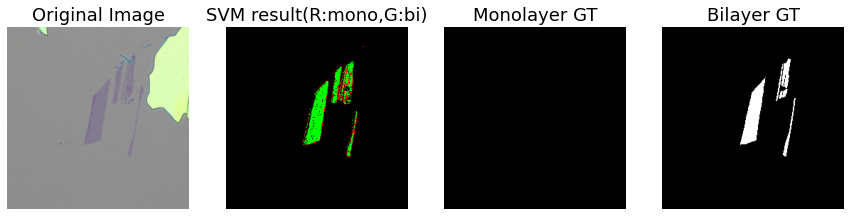

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


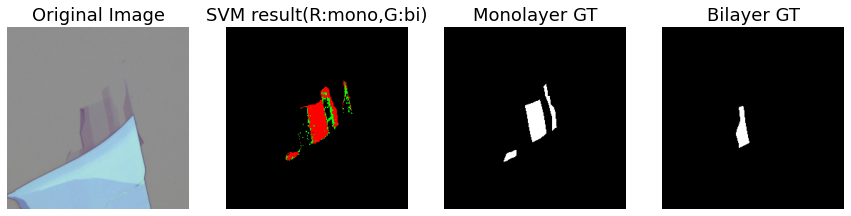

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


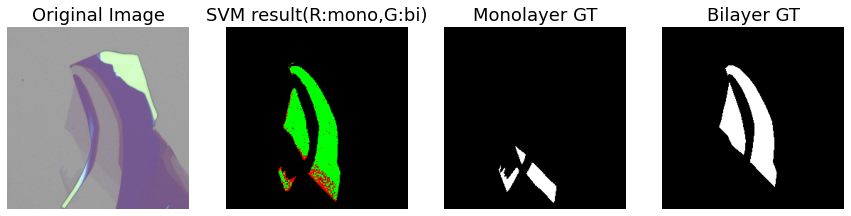

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


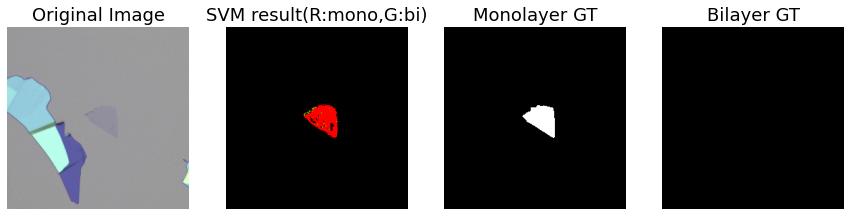

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


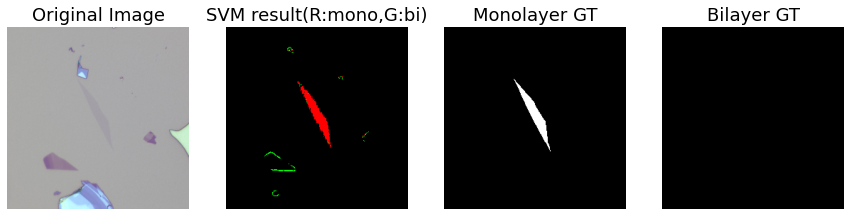

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


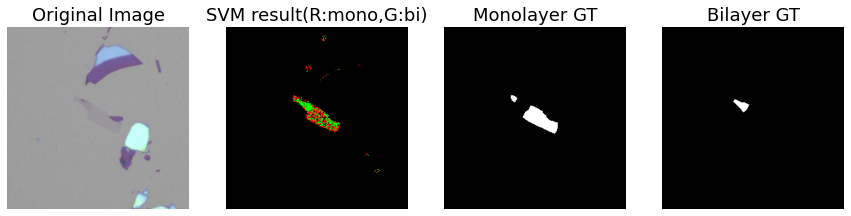

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


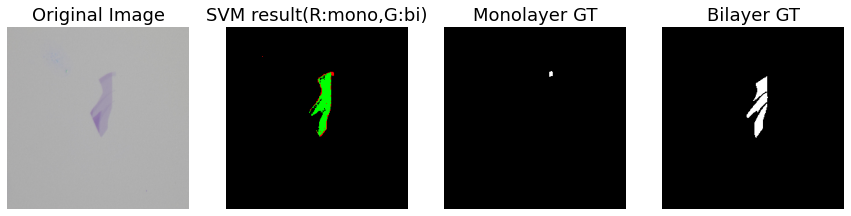

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


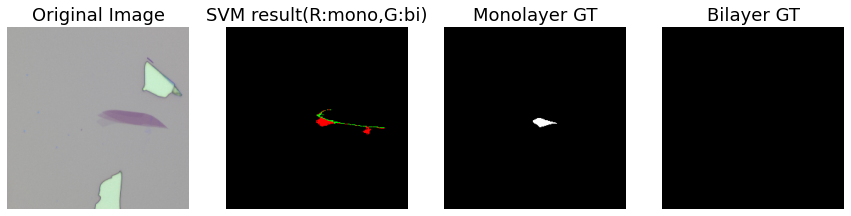

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


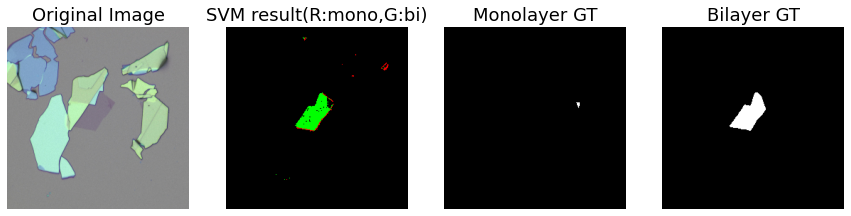

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


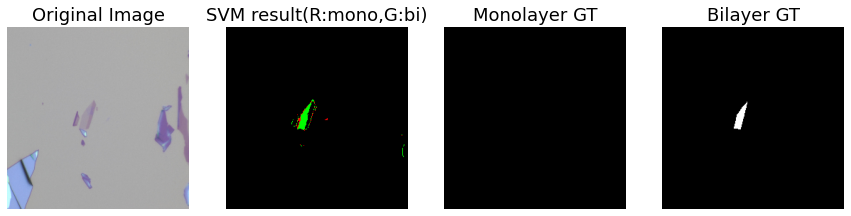

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


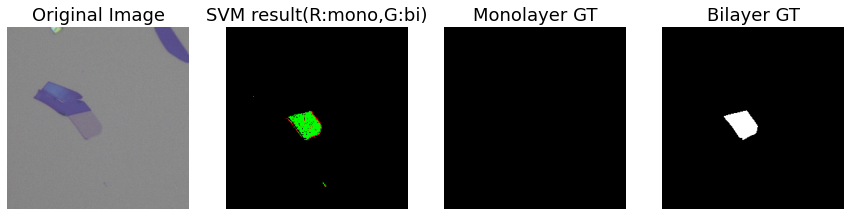

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


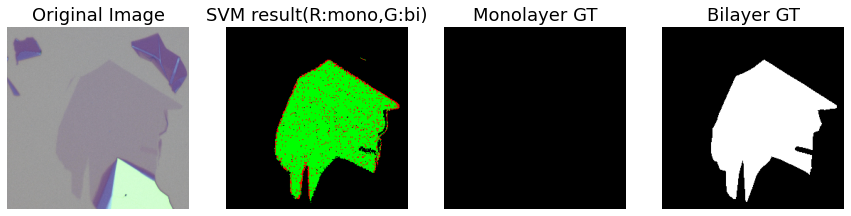

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


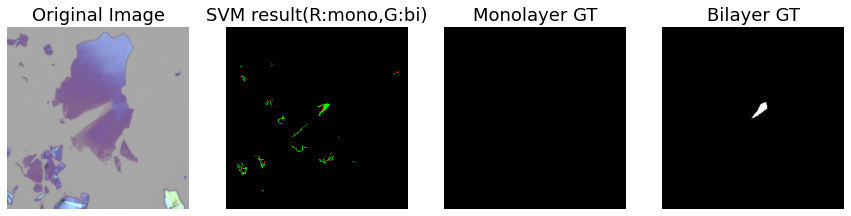

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


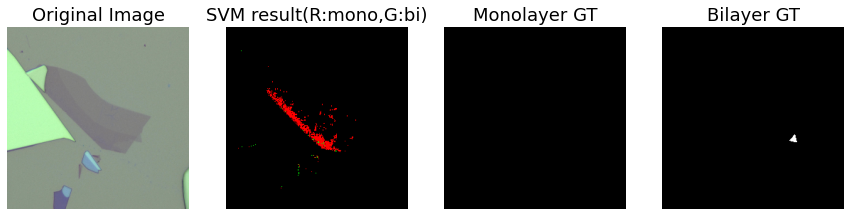

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


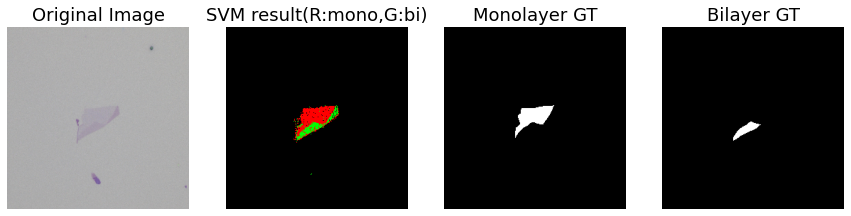

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


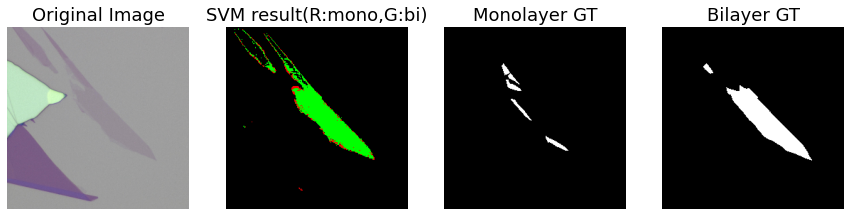

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


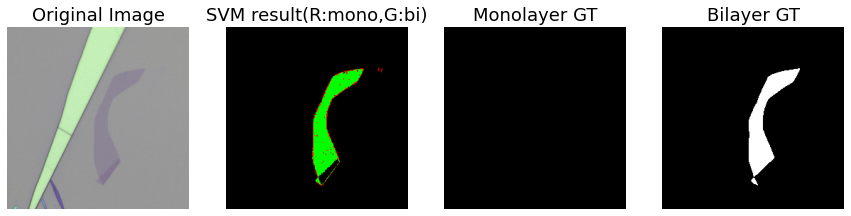

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


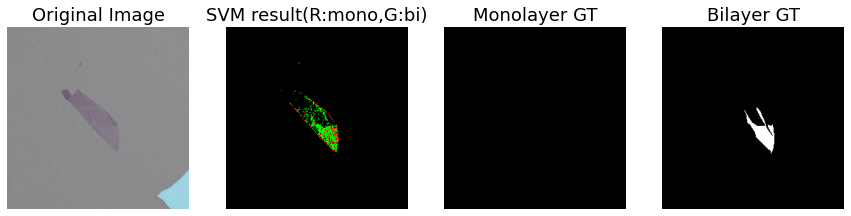

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


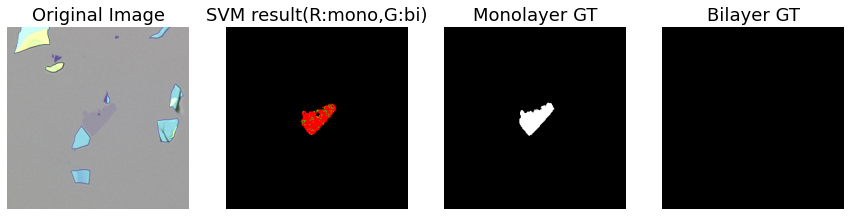

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


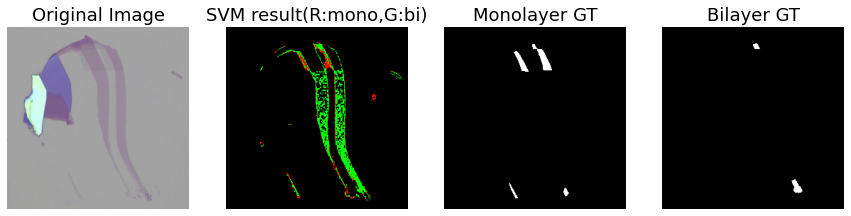

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


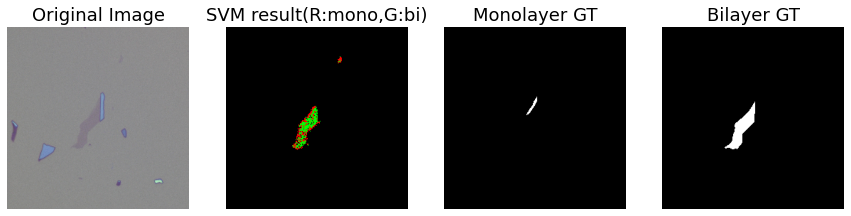

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


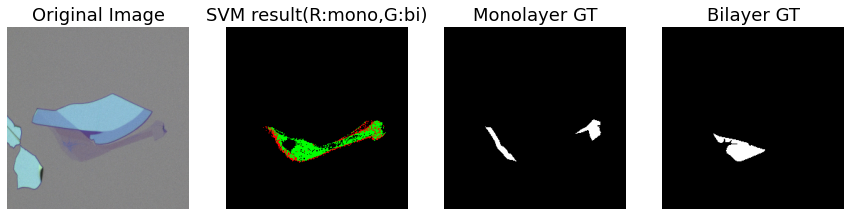

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


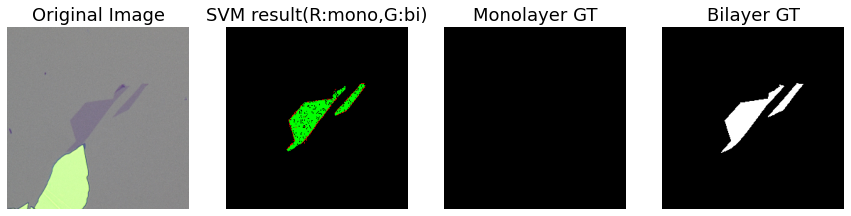

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


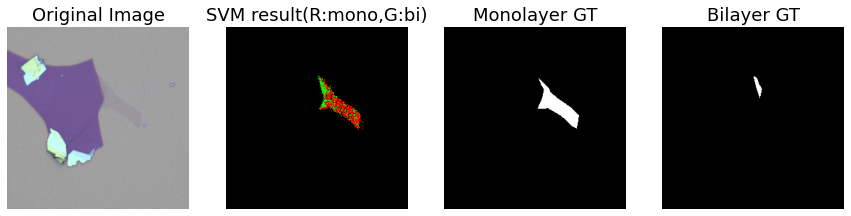

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


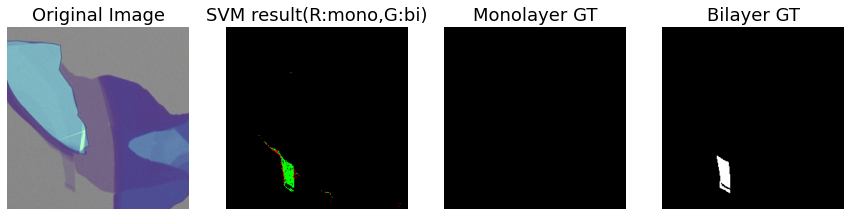

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


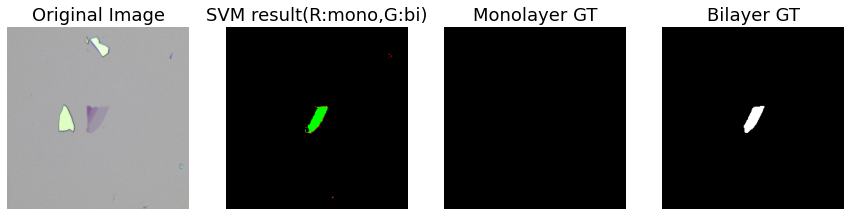

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


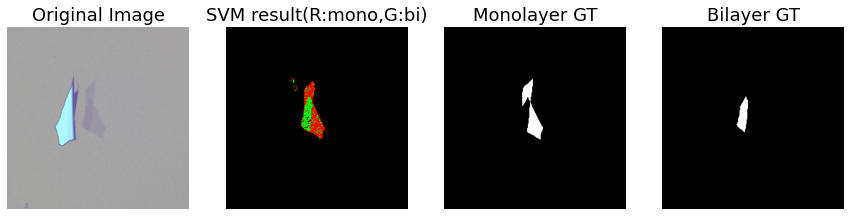

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


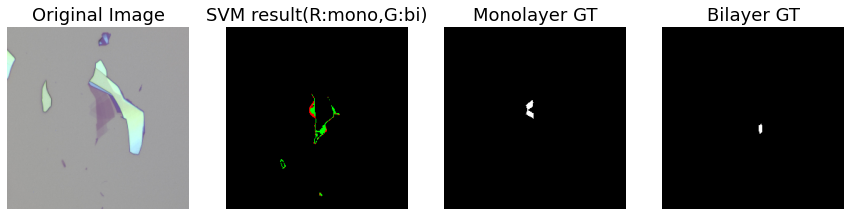

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


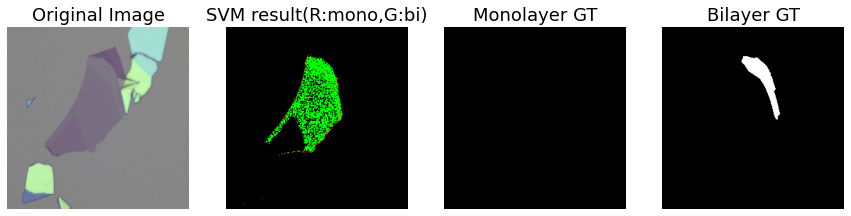

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


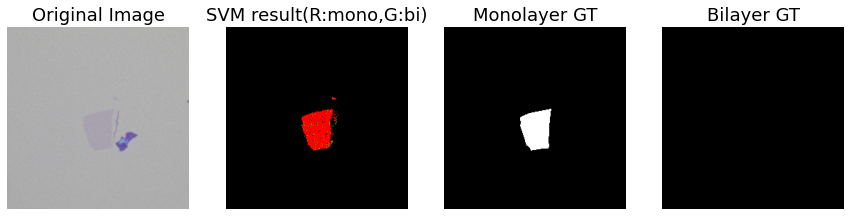

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


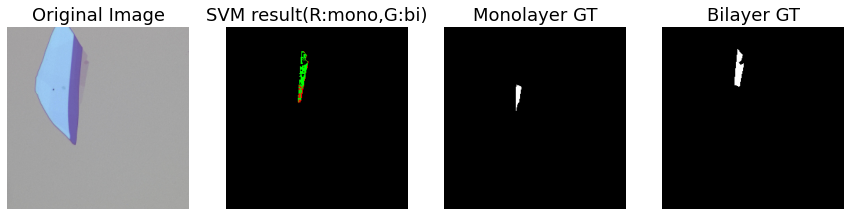

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


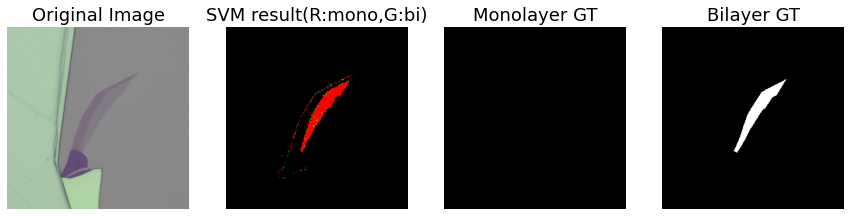

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


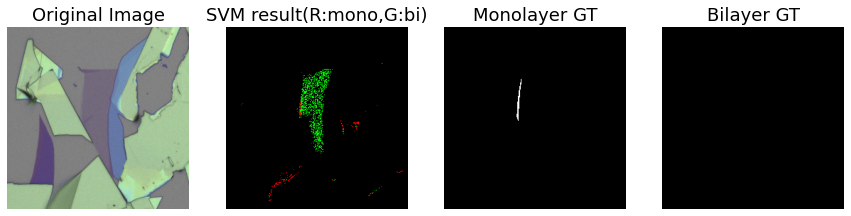

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


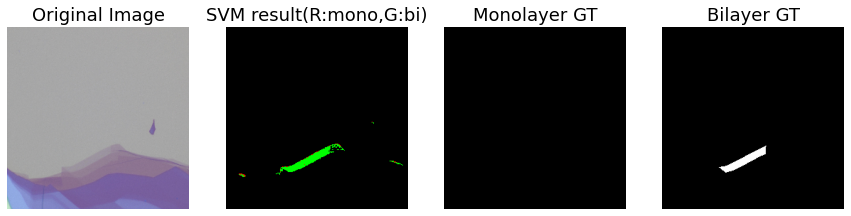

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


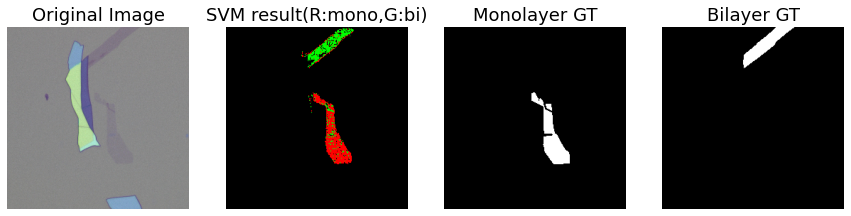

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


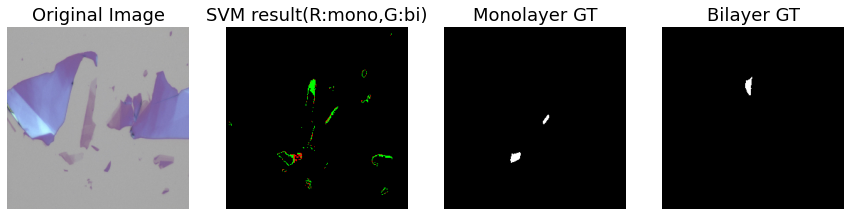

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


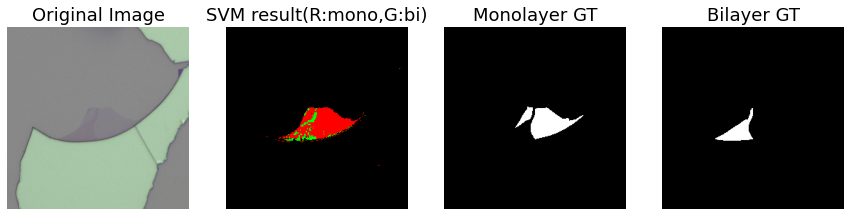

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


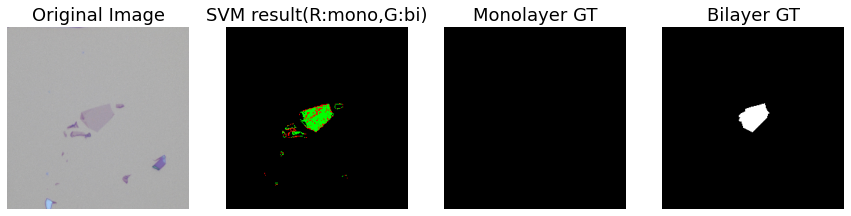

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


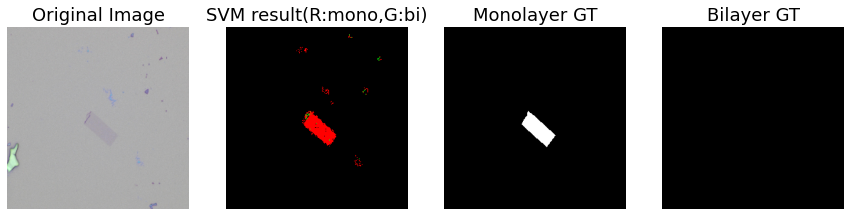

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


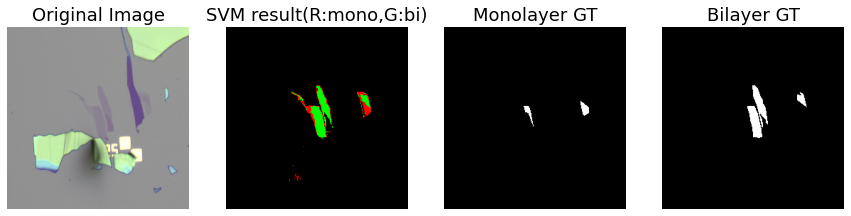

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


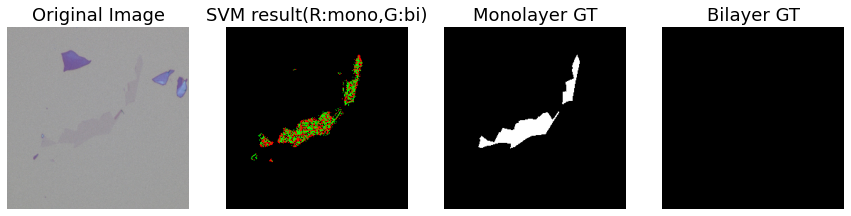

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


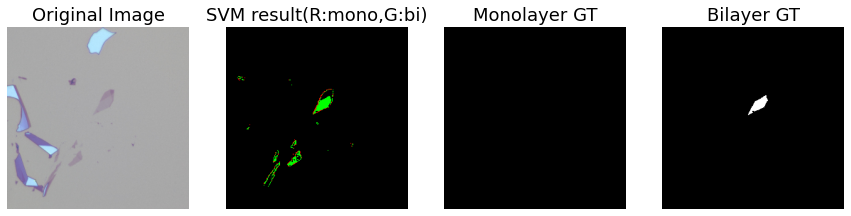

In [42]:
for h in range(57):
  raw1 = cv2.resize(dataset_val.load_image(h),
                        dsize=default_input_size[:2],
                        interpolation=cv2.INTER_CUBIC)/255

  pred_mask = model_attached.predict(np.expand_dims(raw1, 0)).squeeze()
  graphene_pred = pred_mask[:,:,None] * raw1
  graphene_pred = graphene_pred*(1 + np.sign(pred_mask[:,:,None]- 0.844))/2

  red = graphene_pred[:,:,0]
  green = graphene_pred[:,:,1]
  blue = graphene_pred[:,:,2]
  red=red.flatten()
  green = green.flatten()
  blue=blue.flatten()
  for j in range(len(red)):
    k = j%256 
    i = j//256
    if red[j]+green[j]+blue[j] == 0:
      graphene_pred[i,k,:]=0
    else:
      x = np.array([red[j],green[j],blue[j]])
      x = np.expand_dims(x,0)
      x = sc_X.transform(x) # Perform mean and standard deviation on the x value
      y = clf1.predict(x)
      if y==0:
        graphene_pred[i,k,:]=0    
      elif y==1:
        graphene_pred[i,k,:]=0
        graphene_pred[i,k,0]=255
      elif y==2:
        graphene_pred[i,k,:]=0
        graphene_pred[i,k,1]=255


  # Ground truth monolayer
  mmask = np.clip(np.sum(dataset_val.load_mask(h)[0][:,:,[i for i in range(len(dataset_val.load_mask(h)[1])) if dataset_val.load_mask(h)[1][i]==2]],axis=-1,keepdims=True),a_min=0,a_max=1)
  mmask = cv2.resize(mmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  mmask[mmask != 0 ] = 1
    
    # Ground truth bilayer
  bmask = np.clip(np.sum(dataset_val.load_mask(h)[0][:,:,[i for i in range(len(dataset_val.load_mask(h)[1])) if dataset_val.load_mask(h)[1][i]==1]],axis=-1,keepdims=True),a_min=0,a_max=1)
  bmask = cv2.resize(bmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  bmask[bmask != 0 ] = 1

## Plot the images
  fig, ax = plt.subplots(1,4,figsize=(15,60))
  [axi.set_axis_off() for axi in ax.ravel()]
  ax[0].imshow(raw1)
  ax[0].set_title('Original Image',fontsize=18)
  ax[1].imshow(graphene_pred,cmap='gray')
  ax[1].set_title('SVM result(R:mono,G:bi)',fontsize=18)
  ax[2].imshow(mmask,cmap='gray')
  ax[2].set_title('Monolayer GT',fontsize=18)
  ax[3].imshow(bmask,cmap='gray')
  ax[3].set_title('Bilayer GT',fontsize=18)
  plt.show()